# Figure 2:  Cerebellum-specific ALE (C-SALE) maps for Behavioral Domains and Subdomains summarized by Behavioral Domain.
#### Date: 05.08.2024

In [1]:
import os
import sys
import numpy as np
import pandas as pd
import scipy
import scipy.spatial
import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch
import matplotlib.cm
import seaborn as sns
import nilearn.plotting, nilearn.maskers, nilearn.surface
import nibabel as nib
import nimare
from nimare.meta.cbma.ale import ALE
from nimare.correct import FWECorrector
import warnings
import SUITPy.flatmap # Change to SUITpy (if appropriate)
warnings.filterwarnings("ignore")

# Define base directory of the project which is the parent of scripts folder
BASE_DIR = os.path.abspath('../..')
sys.path.append(os.path.join(BASE_DIR, 'scripts'))

import utils

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 300

# Figure 2a, legend inset. Cerebellar lobular definition

We use the Diedrichsen et al. 2009 deterministic lobular definition (Based on Larsel 1973 and Schmahmann 2000, see manuscript).

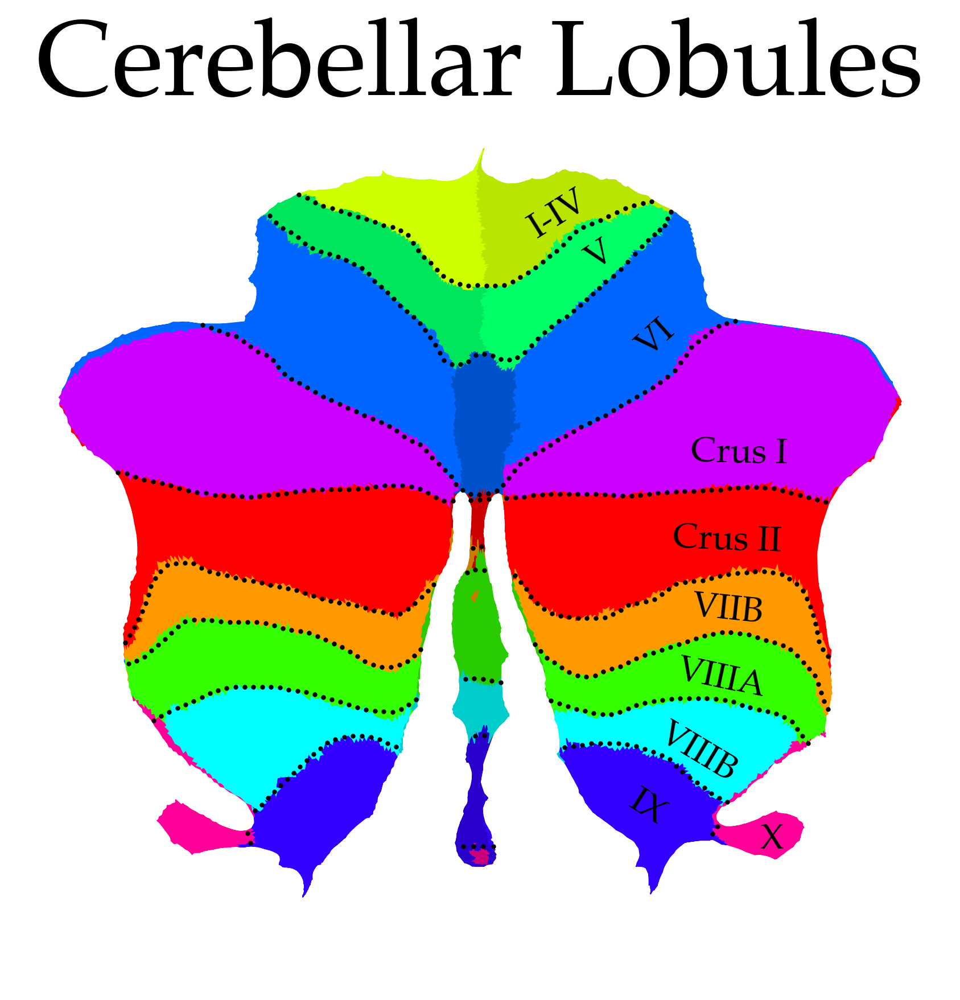

In [2]:
# Load the GIFTI file
G = nib.load(os.path.join(INPUT_DIR, 'maps/Lobules.label.gii'))

# Plot the flatmap
flatmap_plot = SUITPy.flatmap.plot(G, overlay_type='label')

# Set title
flatmap_plot.set_title('Cerebellar Lobules', fontsize=45, y=0.95)

# Manually add the lobule labels (took some trial-and-error)
manual_labels = ['I-IV', 'V', 'VI', 'Crus I', 'Crus II', 'VIIB', 'VIIIA', 'VIIIB', 'IX', 'X']
manual_label_positions = [(0.585, 0.835), (0.63, 0.79), (0.69, 0.70), (0.78, 0.575), (0.767, 0.48), (0.767, 0.405), (0.760, 0.330), (0.735, 0.25), (0.68, 0.190), (0.815, 0.155)]
manual_label_rotations = [32, 34, 42, -1, -2, -6, -12, -31, -32, 0]

for label, position, rotation in zip(manual_labels, manual_label_positions, manual_label_rotations):
    flatmap_plot.text(position[0], position[1], label, fontsize=15, ha='center', va='center', transform=flatmap_plot.transAxes, rotation=rotation, fontweight='bold')

plt.show()

# 2a. Behavioral Domain C-SALE maps: binary locations of thresholded maps

## Load the C-SALE maps (thresholded and unthresholded) for domains

In [3]:
# Obtain the number of experiments from the exp_stats.csv
if os.path.exists(os.path.join(OUTPUT_DIR, 'exp_stats.csv')):
    stats = pd.read_csv(os.path.join(OUTPUT_DIR, 'exp_stats.csv'), index_col=0)
# If the stats file does not exist, create it from json files
else:
    stats = []
    for stats_path in glob.glob(os.path.join(OUTPUT_DIR, 'SALE', '*', '*', 'stats.json')):
        
        # Use regular expression to extract the subbd value
        match = re.search(r'SALE/[^/]+/([^/]+)/stats\.json$', stats_path)
        if match:
            subbd = match.group(1)
        else:
            continue 
            
        with open(stats_path, 'r') as f:
            curr_stats = json.load(f)
        curr_stats['subbd'] = subbd
        stats.append(curr_stats)
    stats = pd.DataFrame(stats).set_index('subbd').sort_index()
    # write to csv
    stats.to_csv(os.path.join(OUTPUT_DIR, 'exp_stats.csv'))

In [4]:
# Initialize dictionaries to store results 
surf_zmaps = {}
surf_zmaps_thr = {}
surf_cluster_boundary_coords = {}
domains = utils.domains_list

for analysis in ['SALE']:
    surf_zmaps[analysis] = {}
    surf_zmaps_thr[analysis] = {}
    surf_cluster_boundary_coords[analysis] = {}
    for domain in domains:
        print(analysis, domain)
        try:
            results = utils.load_results(analysis, domain)
        except FileNotFoundError:
            print(f"{analysis} results not found for {domain}")
            continue
        surf_zmaps[analysis][domain] = results[analysis][domain]['uncorr']
        surf_zmaps_thr[analysis][domain] = results[analysis][domain]['corr']
        surf_cluster_mask = (surf_zmaps_thr[analysis][domain] > 0).astype(int)
        surf_cluster_boundary_coords[analysis][domain] = utils.get_flatmap_mask_boundary_coords(surf_cluster_mask)

SALE Action
SALE Cognition
SALE Emotion
SALE Interoception
SALE Perception


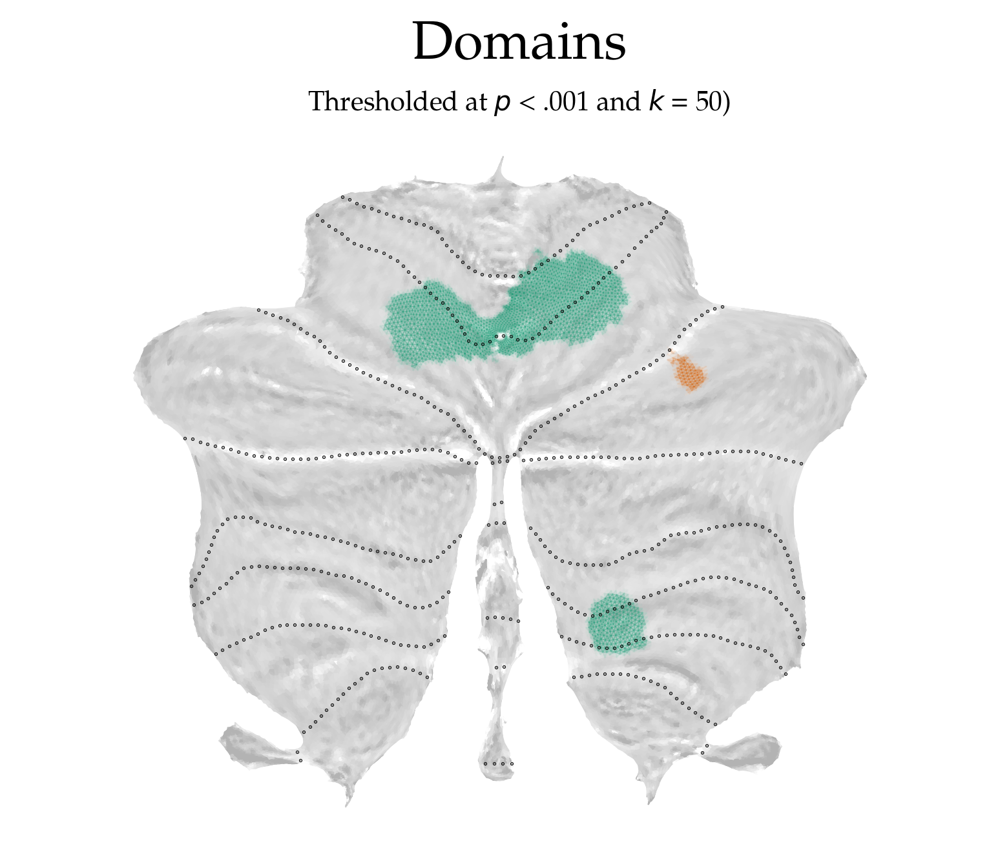

In [5]:
# Creat a figure
fig, ax = plt.subplots()

# Create a background flatmap
grays_mild = LinearSegmentedColormap.from_list(
    'grays_mild', 
    [
        (1, 1, 1, 1), 
        (0.7, 0.7, 0.7, 1) # to make bg grayer, change 0.7 to lower values
    ]
)
SUITPy.flatmap.plot(surf_zmaps_thr['SALE']['Action'] * np.NaN, 
                    colorbar=False, new_figure=False, bordersize=0.5, 
                    undermap=grays_mild
                   )

# Create custom colors from matplotlib 'Dark2'.
clusters_cmap = matplotlib.cm.get_cmap('Dark2')
clusters_colors = np.array([clusters_cmap(i) for i in range(clusters_cmap.N)])
bg_color = (1, 1, 1, 0) # Set a transparent white at the lower end of all colormaps.
clusters_colors[:, 3] = 0.2 # Make cluster colors transparent to show potential overlaps.

# Overlay binary thresholded clusters per domain.
for i, domain in enumerate(domains):
    cmap = LinearSegmentedColormap.from_list('cluster', [bg_color, clusters_colors[i]])
    curr_surf = surf_zmaps_thr['SALE'][domain] > 0
    SUITPy.flatmap.plot(curr_surf, 
                        colorbar=False, new_figure=False, bordersize=0, 
                        backgroundcolor=(0, 0, 0, 0), 
                        underlay=np.zeros_like(curr_surf),
                        cmap=cmap, 
                       )
    
# Set the main title
main_title = "Domains"
ax.set_title(main_title, x=0.52, y= 1.07, fontsize=20)

# Set the subtitle
subtitle = "Thresholded at $\mathit{p}$ < .001 and $\mathit{k}$ = 50)"
ax.text(0.30, 1.02, subtitle, fontsize=10, style='italic', transform=ax.transAxes)

# Create a standalone legend (if desired)
# First, define colors.
colors = clusters_colors[:5]
labels = ['Action', 'Cognition', 'Emotion', 'Interoception', 'Perception']

# Create patch objects for each color
patches = [Patch(color=color, label=label) for color, label in zip(colors, labels)]

# Create a legend based on the patch objects we created.
# legend = ax.legend(handles=patches, loc='center right', bbox_to_anchor=(1.2, 1.0)) 

# 2b. Subdomain C-SALE maps by domain (binary cluster locations).

## Load subdomain maps

In [6]:
# Initialize dictionaries to store results
subbd_surf_zmaps = {}
subbd_surf_zmaps_thr = {}

for analysis in ['SALE']:
    subbd_surf_zmaps[analysis] = {}
    subbd_surf_zmaps_thr[analysis] = {}
    for subdomain in utils.subdomains_with_domains:
        # Split into domain and subdomain (e.g., "Action.Execution")
        domain, subdomain_name = subdomain.split('.', 1)
        print(f"Loading {analysis} results for {subdomain}")
        try:
            results = utils.load_results(analysis, domain, subdomain=subdomain_name)
        except FileNotFoundError:
            print(f"(Un)corrected {analysis} results not found for {subdomain}")
            continue
        subbd_surf_zmaps[analysis][subdomain] = results[analysis][subdomain]['uncorr']
        subbd_surf_zmaps_thr[analysis][subdomain] = results[analysis][subdomain]['corr']

Loading SALE results for Action.Execution
Loading SALE results for Action.Execution.Speech
Loading SALE results for Action.Imagination
Loading SALE results for Action.Inhibition
Loading SALE results for Action.MotorLearning
(Un)corrected SALE results not found for Action.MotorLearning
Loading SALE results for Action.Observation
Loading SALE results for Action.Preparation
(Un)corrected SALE results not found for Action.Preparation
Loading SALE results for Cognition.Attention
Loading SALE results for Cognition.Language
Loading SALE results for Cognition.Language.Orthography
Loading SALE results for Cognition.Language.Phonology
Loading SALE results for Cognition.Language.Semantics
Loading SALE results for Cognition.Language.Speech
Loading SALE results for Cognition.Language.Syntax
(Un)corrected SALE results not found for Cognition.Language.Syntax
Loading SALE results for Cognition.Memory
Loading SALE results for Cognition.Memory.Explicit
Loading SALE results for Cognition.Memory.Working
L

Plot the figure. Note that this takes a while.

No data available for subdomain: Action.MotorLearning
No data available for subdomain: Action.Preparation
No data available for subdomain: Cognition.Language.Syntax
No data available for subdomain: Cognition.Temporal
No data available for subdomain: Emotion.Negative.Anger
No data available for subdomain: Emotion.Negative.Anxiety
No data available for subdomain: Emotion.Negative.Disgust
No data available for subdomain: Emotion.Valence
No data available for subdomain: Interoception.Hunger
No data available for subdomain: Interoception.RespirationRegulation
No data available for subdomain: Perception.Gustation
No data available for subdomain: Perception.Olfaction


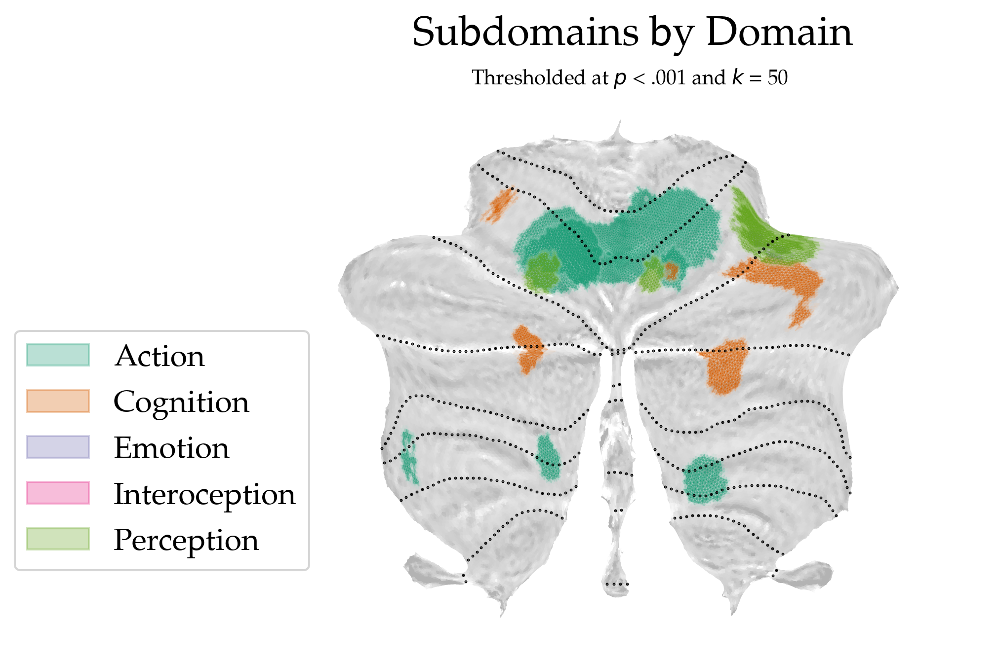

In [7]:
subdomains_with_domains = utils.subdomains_with_domains

# Create a new figure
fig, ax = plt.subplots()

# Create mild greys for the background flatmap
grays_mild = LinearSegmentedColormap.from_list(
    'grays_mild', 
    [
        (1, 1, 1, 1), 
        (0.7, 0.7, 0.7, 1)  # Adjust to make the background grayer if needed
    ]
)

# Plot the background flatmap
SUITPy.flatmap.plot(
    subbd_surf_zmaps_thr['SALE']['Action.Execution'] * np.NaN,  # Use any NaN flatmap as a base
    colorbar=False, new_figure=False, bordersize=0.8, 
    undermap=grays_mild
)

# Set colors for each domain
clusters_cmap = matplotlib.cm.get_cmap('Dark2')
clusters_colors = np.array([clusters_cmap(i) for i in range(clusters_cmap.N)])  # Use colors for domains
bg_color = (1, 1, 1, 0)  # Transparent background color
clusters_colors[:, 3] = 0.3  # Set transparency for cluster colors

# Define domain colors
domain_colors = {
    'Action': clusters_colors[0],
    'Cognition': clusters_colors[1],
    'Emotion': clusters_colors[2],
    'Interoception': clusters_colors[3],
    'Perception': clusters_colors[4]
}

# Store legend handles for each domain
legend_handles = [Patch(color=color, label=domain) for domain, color in domain_colors.items()]

# Overlay clusters for each domain
for domain, color in domain_colors.items():
    # Filter subdomains associated with the current domain
    domain_subdomains = [subdomain for subdomain in subdomains_with_domains if subdomain.startswith(domain)] # Divide subdomains into domains based on the start of their name

    # Overlay clusters for each subdomain
    for subdomain in domain_subdomains:
        
        # Check if the current subdomain exists in the dictionary
        if subdomain in subbd_surf_zmaps_thr['SALE']:
            # Create a colormap for the current domain
            cmap = LinearSegmentedColormap.from_list('cluster', [bg_color, color])
            
            # Get the current surface data
            curr_surf = subbd_surf_zmaps_thr['SALE'][subdomain] > 0  # Threshold or mask the data
            
            # Plot the subdomain over the existing plot
            SUITPy.flatmap.plot(
                curr_surf, 
                colorbar=False, new_figure=False, bordersize=0, 
                backgroundcolor=(0, 0, 0, 0),  # Transparent background for overlay
                cmap=cmap
            )
        else:
            # Handle the case when no matching key is found
            print(f"No data available for subdomain: {subdomain}") # The list of printed subdomains should correspond to the list of printed missing data in the above step.

# Set the main title
main_title = "Subdomains by Domain"
ax.set_title(main_title, x=0.52, y=1.07, fontsize=20)

# Set the subtitle
subtitle = "Thresholded at $\mathit{p}$ < .001 and $\mathit{k}$ = 50"
ax.text(0.30, 1.02, subtitle, fontsize=10, style='italic', transform=ax.transAxes)

# Create a legend for the domains
legend = ax.legend(handles=legend_handles, loc='center right', bbox_to_anchor=(0.1, 0.35), prop={'size': 15})

# plt.show()

# S5. Full unthresholded and thesholded C-SALE z-maps for behavioral domains.

## S5a. Unthresholded maps

Text(0.09, 0.5, 'Unthresholded Z-values')

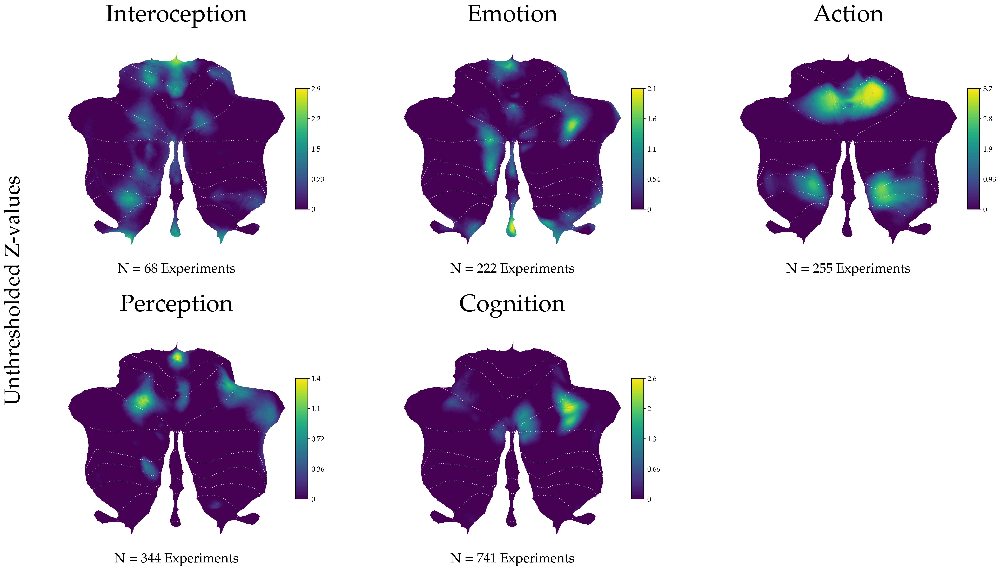

In [8]:
analyis = 'SALE'

# Create a new figure
fig = plt.figure(figsize=(32, 18))

# Order the domains based on the number of experiments
domain_order = stats.loc[domains, 'n_exp'].sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(2, 3, i + 1)
    
    # Plot the unthresholded background map for each domain. Use a color blind-friendly colormap.
    SUITPy.flatmap.plot(surf_zmaps[analysis][domain], colorbar=True, new_figure=False, bordersize=0.5, cmap='viridis', bordercolor='white')

    # Set titles and labels as wanted
    ax.set_title(f"{domain}", fontsize=45)
    ax.text(0.5, 0.0, f'N = {stats.loc[domain, "n_exp"]} Experiments', fontsize=25, ha='center', va='center', transform=ax.transAxes)


# Add a rotated y-label for the entire plot
fig.text(0.09, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

## S5b. Thresholded maps

Text(0.09, 0.5, 'Thresholded ($\\mathit{p}$ < .001 and $\\mathit{k}$ = 50) Z-values')

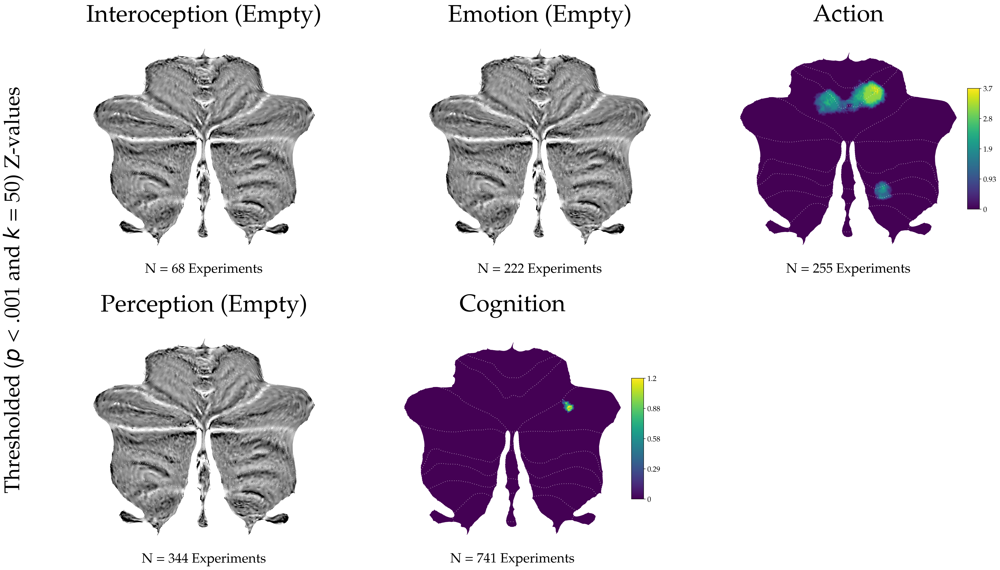

In [9]:
analyis = 'SALE'

# Create a new figure
fig = plt.figure(figsize=(32, 18))

# Order the domains based on the number of experiments
domain_order = stats.loc[domains, 'n_exp'].sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(2, 3, i + 1)

    # Check if the map is completely empty (all values are zero). If so, we just plot the background cerebellar gray matter, and report it is an empty map.
    if np.all(surf_zmaps_thr[analysis][domain] == 0):
        # Plot an empty SUITPy map.
        empty_map = np.zeros_like(surf_zmaps_thr[analysis][domain])  # Create an empty map from the map at hand.
        SUITPy.flatmap.plot(empty_map, colorbar=False, new_figure=False, bordersize=0.5, cmap='viridis', bordercolor='white')
    
        # Set titles and labels (some manual adjustmens may be needed)
        ax.set_title(f"{domain} (Empty)", fontsize=45, y = 1.0825)
        ax.text(0.5, -0.0825, f'N = {stats.loc[domain, "n_exp"]} Experiments', fontsize=25, ha='center', va='center', transform=ax.transAxes)
       
        # Adjust the subplot size for empty maps to make size similar to populated maps
        box = ax.get_position()  # Get current position
        ax.set_position([box.x0 + 0.02, box.y0 + 0.025, box.width * 0.87, box.height * 0.87])  # Adjust size and position

    else: 
        # Plot the unthresholded background map for each domain. Use a color blind-friendly colormap.
        SUITPy.flatmap.plot(surf_zmaps_thr[analysis][domain], colorbar=True, new_figure=False, bordersize=0.5, cmap='viridis', bordercolor='white')
    
        # Set titles and labels as wanted
        ax.set_title(f"{domain}", fontsize=45)
        ax.text(0.5, 0.0, f'N = {stats.loc[domain, "n_exp"]} Experiments', fontsize=25, ha='center', va='center', transform=ax.transAxes)


# Add a rotated y-label for the entire plot
fig.text(0.09, 0.5, 'Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Z-values', va='center', ha='center', rotation='vertical', fontsize=40)